# Notebook for creating various plots from WRF output

This notebook contains plotting procedures for generating various plots and calculations specifically for model output from WRF.

### Initializing the notebook

In [2]:
import numpy as np, matplotlib.pyplot as plt, cartopy as cp, pandas as pd, netCDF4 as nc, wrf, xarray as xr, time, datetime, tqdm
import matplotlib, PIL, os #For animations
from IPython.display import HTML, Image, display, Video #For displaying animations
from ipywidgets import interact, interactive, fixed, widgets 
plt.rcParams["text.usetex"] = True
from plotting_functions import *
from utils import *
import shapely
import warnings
from shapely.errors import ShapelyDeprecationWarning
warnings.filterwarnings("ignore", category=ShapelyDeprecationWarning)

In [4]:
test = xr.open_dataset('/nird/projects/NS9600K/brittsc/WRF_output_Stian/' + 'Milbrandt/wrfout_d03_2019-11-11_12:00:00')
test.QCLOUD.min()

<xarray.DataArray 'QCLOUD' ()>
array(-2.89107757e-12)

In [2]:
matplotlib.use('Agg')
%matplotlib inline
%matplotlib ipympl

In [3]:
Milbrandt1 = 'Milbrandt/wrfout_d01_2019-11-11_12:00:00'
Milbrandt3 = 'Milbrandt/wrfout_d03_2019-11-11_12:00:00'
Morrison3 = 'Morrison/wrfout_d03_2019-11-11_12:00:00'

In [4]:
class ModelOutput:
    '''Create a class structure for netCDF output.
       Should work as the usual netCDF4.Dataset output but with additional properties
       such as pressure etc. '''
    def __init__(self, datapath, up_to_level=70, timeit=False):
        s = time.time()
        Data = nc.Dataset(datapath)
        self.Data = Data
        self.xrData = xr.open_dataset(datapath, cache=False).isel(bottom_top=slice(0,up_to_level))
        lat = wrf.getvar(Data, "lat")
        lon = wrf.getvar(Data, "lon")
        self.extent = (np.amin(lat), np.amax(lat), np.amin(lon), np.amax(lon)) 
        date = self.Data.variables['XTIME'].units[14:24] # More readable date and hour
        start_hour = self.Data.variables['XTIME'].units[25:27]
        self.date = datetime.datetime(*[int(i) for i in date.split('-')], int(start_hour))
        
        self.calc_density()
        
        all_ice = self.convert_to_gm3(self.xrData['QICE'])
        for var in tqdm.tqdm(['QSNOW', 'QGRAUP', 'QHAIL']):
            try:
                all_ice += self.convert_to_gm3(self.xrData[var])
            except:
                pass
            
        all_liquid = self.convert_to_gm3(self.xrData['QCLOUD']) + self.convert_to_gm3(self.xrData['QRAIN'])
        
        self.xrData['Q_ALL_ICE'] = all_ice
        self.xrData['Q_ALL_LIQUID'] = all_liquid
        self.xrData['IWF'] = self.IceWaterFraction(all_ice, all_liquid)
        self.xrData['LWP'] = np.sum(all_liquid, axis=1)
        self.xrData['IWP'] = np.sum(all_ice, axis=1)
        
        self.xrData['Q_ALL_ICE'].attrs['units'] = 'g/m3'
        self.xrData['Q_ALL_LIQUID'].attrs['units'] = 'g/m3'
        self.xrData['IWF'].attrs['units'] = 'fraction'
        self.xrData['LWP'].attrs['units'] = 'g/m2'
        self.xrData['IWP'].attrs['units'] = 'g/m2'
        
        #self.INF = self.xrData['QNICE'] / (self.xrData['QNICE'] + self.xrData['QNCLOUD'])
        
        if timeit:
            print(f'Elapsed time: {round(time.time() - s, 2)} seconds')
    
    def calc_density(self):
            P = self.xrData['P']+ self.xrData['PB']
            theta = self.xrData['T'] + 300 #+ self.xrData['T00'] NO clue why
            T = wrf.tk(P, theta)
            Tv = wrf.tvirtual(T, self.xrData['QVAPOR'], units='K')
            self.xrData['density'] = P / (287 * Tv)
        
    def convert_to_gm3(self, var):
        ''' Method for converting mizing ratios of units kg/kg to g/m3. 
            This requires a lot of memory so it cannot be done for all levels simultanously. '''
        return var * 1000 * self.xrData.density
    
    def IceWaterFraction(self, ice, liquid, cutoff=0.005): # Do 0.005, check with korolev
        ''' Calculate the ice water fraction based on total ice mixing ratio (in g/m3) and liquid water mixing ratio. 
            'Cutoff' determines values of ice and liquid deemed too low to define a cloud and are thus omitted. Default is 0.001 g/m3'''
        ice = ice.where(ice > cutoff, other=0)
        liquid = liquid.where(liquid > cutoff, other=0)
        return ice / (liquid + ice)

### Reading the data

In [5]:
Mil3 = ModelOutput(Milbrandt3, timeit=True)

100%|██████████| 3/3 [01:29<00:00, 29.81s/it]


Elapsed time: 357.97 seconds


In [57]:
#Mor3 = ModelOutput(Morrison3, timeit=True)

In [6]:
#Mil1 = ModelOutput(Milbrandt1, timeit=True)

## Find Mixed-Phase cloud regions

In [92]:
def MPC(data, lower_limit, upper_limit):
    ''' Find regions in the model domain where the IWF is between upper and lower thresholds.
        Parameters
        ------------
        data        - (ModelOutput obj) instance of ModelOutput class with WRF model simulation data
        lower_limit - (float) lower limit to distinguish mixed-phase from pure liquid cloud
        upper_limit - (float) upper limit to distinguish mixed-phase from pure ice cloud
        '''
    pass
        

# 2D horizontal map-plot

### Code block

In [6]:
def area_plot(data, var, t=1, height=0, directdata=None, figure=None, lower_cut=-10000, upper_cut=10000, only_andoya=False, filled_contours=True, cb_levels=None, cb_extend='neither', 
              cb_pad=0.05, cb_center=None, cmap='jet', alpha=0.8, figname=None, showfig=False, units=r'g m$^{-3}$', return_map=False, contour_labels=False, display_height=True):
    '''
    Plot horizontal map using Lambert Conformal projection of WRF simulation over Andoya.
    Parameters:
    -----------
    data             - (ModelOutput obj) instance of ModelOutput class with WRF model simulation data
    var              - (string) name of 3 or 4 dimensional variable to plot. If directdata is used, this will be used for creating plot title
    t                - (int) timestep at which to plot data, default is 1
    height           - (int) model altitude level to plot at, default is 0
    directdata       - (xarray object) use if the variable to plot is calculated manually and not accessed from netcdf dataset, default is None
    figure           - (list-like) plt.figure instance for creating subplots. First entry fig instance, second of form 321 or map instance. Default is None
    lower_cut        - (float) lowest values to plot, default is -10000
    upper_cut        - (float) highest values to plot, default is 10000
    filled_contours  - (boolean) use either filled (True) or not filled (False) contour lines, default is True
    only_andoya      - (boolean) whether to plot full model area or only Andoya specifically, default False
    cb_levels        - (list-like) specify min/max range and number of bins for colorbar, default is None
    cb_pad           - (float) spacing between colorbar and plot in fraction of total plot width/height, default is 0.05
    cb_extend        - (string) specify to include or exclude values outside of colorbar range specified in cb_minmax (can be 'min', 'max', 'neither' or 'both', default 'max'
    cb_center        - (float) set the value to use as the center of the colormap, default is None
    cmap             - (string) name of plt.colormap instance to use for plotting, default is 'jet'
    alpha            - (float) fraction of 1 to determine opacity of colors, default is 0.8
    figname          - (string) pass filename if figure should be saved, default is None
    showfig          - (boolean) show figure or hold if multiple figures should be plotted, default is False
    units            - (string) display name for the units of colorbar, default is 'g/m3'
    return_map       - (boolean) if True return the map instance for plotting more to the same axis, default is False
    contour_labels   - (boolean) if True display contour labels in unfilled contours in-line, default is False
    display_height   - (boolean) whether ot not to include height in plot title, default is True
    '''

    #Area to plot for
    if only_andoya:
        min_lat = 75.5
        max_lat = 81.2
        min_lon = 6.97
        max_lon = 32.33

    else:
        min_lat, max_lat, min_lon, max_lon = data.extent
    
    #Create map instance (choose projection)
    proj = cp.crs.LambertConformal(central_latitude=(min_lat + max_lat)/2, central_longitude=(max_lon + min_lon)/2)
    PC = cp.crs.PlateCarree()
    
    # Either create new figure and axes if nothing is passed, or use the passed figure to create new subplot
    if figure is None:
        fig = plt.figure(figsize=(5, 5))
        map = fig.add_subplot(projection=proj)
    elif type(figure[1]) != int:
        fig = figure[0]
        map = figure[1]
    else:
        fig = figure[0]
        map = fig.add_subplot(figure[1], projection=proj)
    map.set_extent([min_lon, max_lon, min_lat, max_lat], crs=PC)
    map.add_feature(cp.feature.LAND)
    map.add_feature(cp.feature.COASTLINE)
    
    cmap = plt.get_cmap(cmap)
    
    
    if directdata is not None:
        data_to_plot = directdata
    else:
        data_to_plot = data.xrData[var]
    
    if len(data_to_plot.shape) == 3:
        to_plot = data_to_plot.isel(Time=t)

    elif len(data_to_plot.shape) == 4:
        try:
            to_plot = data_to_plot.isel(Time=t, bottom_top=height)
        except:
            to_plot = data_to_plot.isel(Time=t, bottom_top_stag=height)
        
    to_plot = to_plot.where(to_plot >= lower_cut, other=np.nan)
    to_plot = to_plot.where(to_plot <= upper_cut, other=np.nan)
    
    if filled_contours:
        if cb_center is not None:
            norm = matplotlib.colors.TwoSlopeNorm(vcenter=cb_center)
            plot = map.contourf(wrf.getvar(Mil3.Data, 'lon'), wrf.getvar(Mil3.Data, 'lat'), to_plot, 10, transform=PC, levels=cb_levels, 
                            alpha=alpha, cmap=cmap, extend=cb_extend, norm=norm)
        else:
            plot = map.contourf(wrf.getvar(Mil3.Data, 'lon'), wrf.getvar(Mil3.Data, 'lat'), to_plot, 10, transform=PC, levels=cb_levels, 
                            alpha=alpha, cmap=cmap, extend=cb_extend)
        if directdata is None:
            if units is None:
                plt.colorbar(plot, ax=map, orientation='horizontal', label=data.Data.variables[var].units, fraction=0.043, pad=cb_pad)
            else:
                plt.colorbar(plot, ax=map, orientation='horizontal', label=units, fraction=0.043, pad=cb_pad)
        else:
            plt.colorbar(plot, ax=map, orientation='horizontal', label=units, fraction=0.043, pad=cb_pad)
    
    else:
        if cb_center is not None:
            norm = matplotlib.colors.TwoSlopeNorm(vcenter=cb_center)
            plot = map.contour(wrf.getvar(Mil3.Data, 'lon'), wrf.getvar(Mil3.Data, 'lat'), to_plot, 10, transform=PC, levels=cb_levels, 
                            alpha=alpha, cmap=cmap, extend=cb_extend, norm=norm)

        else:
            plot = map.contour(wrf.getvar(Mil3.Data, 'lon'), wrf.getvar(Mil3.Data, 'lat'), to_plot, 10, transform=PC, levels=cb_levels, 
                            alpha=alpha, colors='k', extend=cb_extend)
        if contour_labels:
            map.clabel(plot, plot.levels, inline=True, fontsize=5)
        
    #Find and set date and time as title
    if display_height:
        plt.title(var + ' ' + str(data.date + datetime.timedelta(minutes=int(data.Data.variables['XTIME'][t]))) + ' H=' + str(int(wrf.getvar(Mil3.Data, 'z')[height, 10,10])) + 'm')
    else:
        plt.title(var + ' ' + str(data.date + datetime.timedelta(minutes=int(data.Data.variables['XTIME'][t]))))

    NYA_lonlat = (11.909895, 78.923538)
    city = map.plot(*NYA_lonlat, 'ro', transform=PC)
    fig.tight_layout()
    if figname is not None:
        plt.savefig('plots/' + figname)
    if showfig:
        plt.show()
    if return_map:
        return map

### Example usage

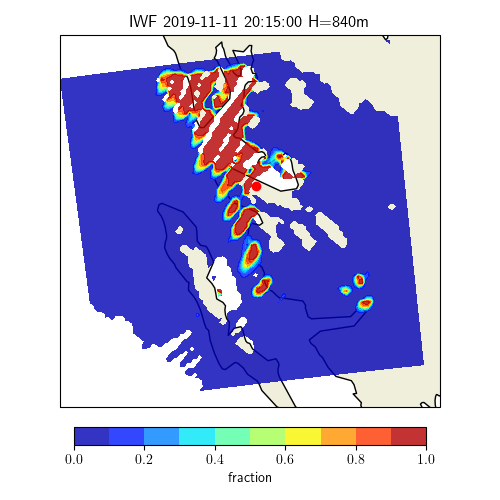

In [7]:
area_plot(Mil3, 'IWF', t=99, units='fraction', height=35, showfig=True, cb_levels=np.linspace(0, 1, 11))

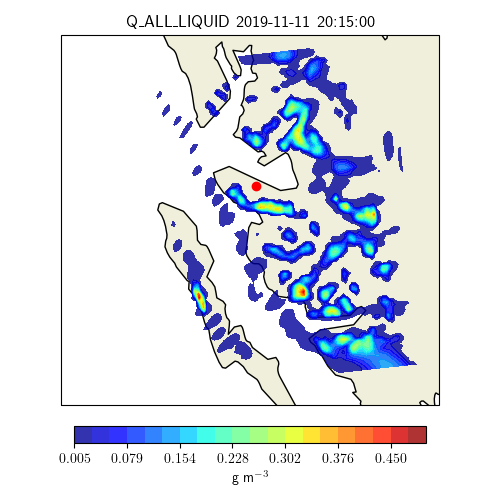

In [8]:
area_plot(Mil3, 'Q_ALL_LIQUID', t=99, display_height=False, cb_levels=np.linspace(0.005, 0.5, 21).round(3))

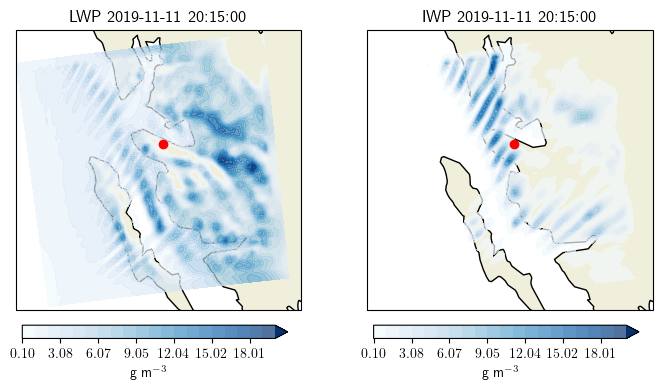

In [97]:
def LWPTest(t, returnfig=True):
    fig = plt.figure(figsize = (8, 4))
    area_plot(Mil3, 'LWP', t=t, figure=(fig, 121), cb_levels=np.linspace(0.1, 20, 21), cb_extend='max', alpha=0.7, cmap='Blues', display_height=False)
    area_plot(Mil3, 'IWP', t=t, figure=(fig, 122), cb_levels=np.linspace(0.1, 20, 21), cb_extend='max', alpha=0.7, cmap='Blues', showfig=True, display_height=False)
    if returnfig:
        return fig
LWPTest(99, returnfig=False)

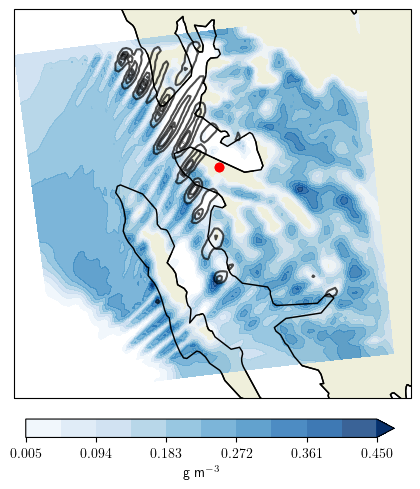

In [61]:
fig = plt.figure(figsize=(5,5))
map = area_plot(Mil3, 'Q_ALL_LIQUID', height=35, t=99, figure=(fig, 111), showfig=False, return_map=True, cb_levels=np.linspace(0.005, 0.45, 11), cmap='Blues', cb_extend='max')
area_plot(Mil3, 'Q_ALL_ICE', height=35, t=99, figure=(fig, map), filled_contours=False, units='Fraction', showfig=True, cmap='jet_r', cb_levels=[0.05, 0.2, 0.3, 0.4], alpha=0.7)

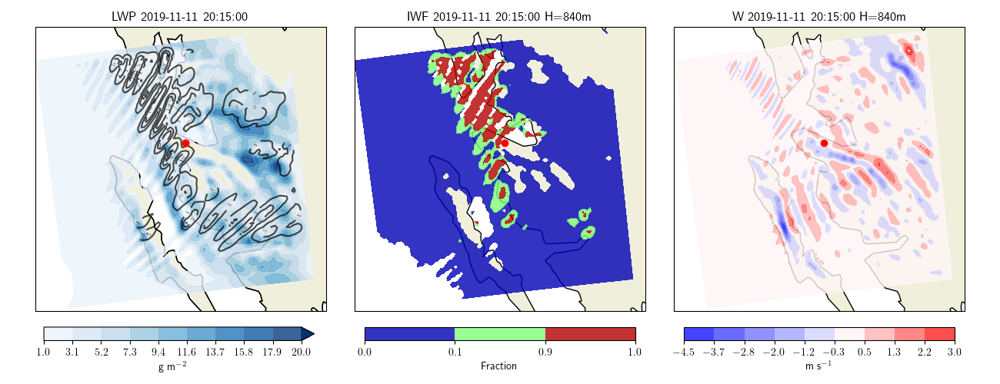

In [9]:
def area_subplots(t, h=35, showfig=False):
    # This function can either be used to create 4 defined subplots, or be called from animate()
    plt.close('all')
    fig = plt.figure(figsize=(13,5))
    
    map = area_plot(Mil3, 'IWP', filled_contours=False, height=h, t=t, figure=(fig, 131), showfig=False, cb_levels=[1, 5, 10, 20], 
                    alpha=0.7, cmap='Blues', return_map=True, contour_labels=True)
    area_plot(Mil3, 'LWP', height=h, t=t, figure=(fig, map), showfig=False, cb_levels=np.linspace(1, 20, 10).round(1), cmap='Blues', 
              cb_extend='max', units='g m$^{-2}$', display_height=False)
    area_plot(Mil3, 'IWF', height=h, t=t, figure=(fig, 132), units='Fraction', showfig=False, cmap='jet', cb_levels=[0, 0.1, 0.9, 1])
    area_plot(Mil3, 'W', height=h, t=t, units='m s$^{-1}$', figure=(fig,133), cmap='bwr', cb_levels=np.linspace(-4.5, 3, 10).round(1), showfig=False, cb_center=0)
    
    #plt.subplots_adjust(wspace=-0.4, hspace=-0.4)
    
    if showfig:
        plt.show()
    else:
        return fig
area_subplots(99, showfig=True)

# Transect Plots

### Code block

In [16]:
def transect_plot(data, var, t=None, directdata=None, start_coord=None, end_coord=None, pivot_coord=(78.923538, 11.909895), angle=212, 
                  prognostic=False, cmap='jet', maxheight=-1, figname=None, showfig=True, filled_contours=True, cb_levels=10, cb_extend='neither',                               cb_center=None, figure=None, axs=None, units='g m$^{-3}$', lower_cut=-10000, upper_cut=10000, return_coords=False, time_legend=False,                           legend_bbox=(0, 1.04), xlabel=True, return_ax=False, show_labels=True, title=None):
    ''' 
    Apply the wrf python module functions vertcross, getvar and CoordPair.
    Computes the transect line between start_coord and end_coord (lat, lon) or through pivot point (lat, lon) and angle and plot a variable.
    Parameters:
    -----------
    data             - (ModelOutput obj) instance of ModelOutput class with WRF model simulation data
    var              - (string) name of 3 or 4 dimensional variable to plot. If directdata is used, this will be used for creating plot title
    t                - (int) timestep at which to plot data, default is 1
    directdata       - (xarray object) use if the variable to plot is calculated manually and not accessed from netcdf dataset, default is None
    start_coord      - (list-like) coordinates of start point of transect, default is None
    end_coord        - (list-like) coordinates of end point of transect, default is None
    pivot_coord      - (list-like) coordinates of center location for transect, default is (78.923538, 11.909895) (Ny-Ålesund)
    angle            - (list-like) angle in degrees to tilt transect (positive clockwise, 0 north), default is 0
    prognostic       - (Boolean) if True the variable is calculated using wrf.getvar() 
                                 (must be a prognostic variable available from wrf module), default is False 
    cmap             - (string) matplotlib color map name to use for plotting
    maxheight        - (int) maximum height in model levels to which the transect should be plotted (use -1 if all), default is -1
    figname          - (string) pass filename if figure should be saved, default is None
    showfig          - (boolean) show figure or hold if multiple figures should be plotted, default is True
    filled_contours  - (boolean) use either filled (True) or not filled (False) contour lines, default is True
    cb_levels        - (list-like) intervals to use for colorbar, default is None
    cb_extend        - (string) specify to include or exclude values outside of colorbar range specified in cb_levels 
                                (can be 'min', 'max', 'neither' or 'both', default 'neither')
    cb_center        - (float) set the value to use as the center of the colormap, default is None
    fig              - (list-like) specify figure and add subplot to it. First entry is plt.figure instance, 
                                   second is 3 digit integer to specify subplot placement, default is None.
    axs              - (plt.axes obj) specify axes instance to plot on if needed, default is None
    units            - (string) display name for the units of colorbar, default is 'g/m3'
    cutoff           - (float) lowest values to plot, default is -10000
    return_coords    - (boolean or array) return the xy_loc coordinates to use for later plotting, default False
    time_legend      - (boolean) turn on or off legend with timestamp, default is False
    legend_bbox      - (tuple) contains the bbox legend placement in axis coordinates, default is (1, 1.5)
    xlabel           - (boolean) show the xlabel or not (useful for sharex subplots), default is True
    show_labels      - (boolean) display inline unfilled contour labels or not, default is True
    '''
    # Terrain
    ter = data.xrData['HGT'].isel(Time=1) #wrf.getvar(data.Data, "ter", timeidx=-1)
    z = wrf.getvar(data.Data, 'z')
    H = z[:, 10, 10]
    
    mHidx = maxheight #len(H[H <= maxheight])


    if prognostic:
        ds = wrf.getvar(data.Data, var)[t, :mHidx]
        
    elif directdata is not None:
        ds = directdata[t, :]
        maxlevel = len(ds[:]) - 1
        if maxlevel <= mHidx or mHidx < 0:
            mHidx = maxlevel
        
    else:
        ds = data.xrData[var][t, :mHidx] #Must use xrData in order to preserve metadata for ticks 
        
    if mHidx < 0:
        mHidx = len(ds[:]) - 1
    
    if start_coord != None and end_coord != None:
        start_point = wrf.CoordPair(lat=start_coord[0], lon=start_coord[1])
        end_point = wrf.CoordPair(lat=end_coord[0], lon=end_coord[1])
        
        cross = wrf.vertcross(ds[:mHidx], z[:mHidx], wrfin=data.Data, start_point=start_point, end_point=end_point, latlon=True, meta=True)
        ter_line = wrf.interpline(ter, wrfin=data.Data, start_point=start_point, end_point=end_point)
    
    elif pivot_coord != None and angle != None:
        pivot_point = wrf.CoordPair(lat=pivot_coord[0], lon=pivot_coord[1])
        
        cross = wrf.vertcross(ds[:mHidx], z[:mHidx], wrfin=data.Data, pivot_point=pivot_point, angle=angle, latlon=True, meta=True)
        ter_line = wrf.interpline(ter, wrfin=data.Data, pivot_point=pivot_point, angle=angle, latlon=True, meta=True)
    
    if figure is not None:
        fig = figure[0]
        ax = fig.add_subplot(figure[1])
        fig.tight_layout()
    
    elif axs is None: 
        fig = plt.figure(figsize=(10,3))
        ax = plt.axes()
        fig.tight_layout()
    
    else: #axs is not None
        ax = axs

    to_plot = wrf.to_np(cross)
    to_plot[to_plot <= lower_cut] = np.nan
    to_plot[to_plot >= upper_cut] = np.nan
    
    if filled_contours:
        if cb_levels is not None:
            if cb_center is not None:
                norm = matplotlib.colors.TwoSlopeNorm(vcenter=cb_center)
                contour = ax.contourf(to_plot[:mHidx], cmap=plt.get_cmap(cmap), levels=cb_levels, extend=cb_extend, norm=norm)
            else:
                contour = ax.contourf(to_plot[:mHidx], cmap=plt.get_cmap(cmap), levels=cb_levels, extend=cb_extend)
        else:
            contour = ax.contourf(to_plot[:mHidx], cmap=plt.get_cmap(cmap))
            
        if directdata is not None:
            plt.colorbar(contour, ax=ax, label=units)
        else:
            plt.colorbar(contour, ax=ax, label=data.xrData[var].units)
    else:
        if cb_levels is not None:
            if cb_center is not None:
                norm = matplotlib.colors.TwoSlopeNorm(vcenter=cb_center)
                contour = ax.contour(to_plot[:mHidx], colors='k', levels=cb_levels, extend=cb_extend, norm=norm)
            else:
                contour = ax.contour(to_plot[:mHidx], colors='k', levels=cb_levels, extend=cb_extend)
        else:
            contour = ax.contour(to_plot[:mHidx], colors='k')
        if show_labels:
            ax.clabel(contour, contour.levels, inline=True, fontsize=5)
 
        
    #Terrain
    ht_fill = ax.fill_between(np.arange(0, cross.shape[1], 1), 0, ter_line / 28, facecolor="saddlebrown")
        
    #---------------------------------------------------------------------
    # Set the x-ticks to use latitude and longitude labels.
    if type(return_coords) == tuple:
        # Workaround to avoid missing metadata in IWF calculation.
        coord_pairs = return_coords[0]
    else:
        coord_pairs = wrf.to_np(cross.coords["xy_loc"])
        
    x_ticks = np.arange(coord_pairs.shape[0])
    x_labels = [pair.latlon_str(fmt="{:.2f}N, {:.2f}E") for pair in wrf.to_np(coord_pairs)]
    ax.set_xticks(x_ticks[::20])
    ax.set_xticklabels(x_labels[::20], rotation=0, fontsize=8)

    # Set the y-ticks to be height.
    if type(return_coords) == tuple:
        vert_vals = return_coords[1]
    else:
        vert_vals = wrf.to_np(cross[:mHidx,:].coords["vertical"]).astype(int)
    v_ticks = np.arange(vert_vals.shape[0])
    ax.set_yticks(v_ticks[::int(mHidx/5)])
    ax.set_yticklabels(vert_vals[::int(mHidx/5)], fontsize=8)
    #------------------------------------------------------------------------
    if title is None:
        ax.set_title(var)
    else:
        ax.set_title(title)
    ax.set_ylabel("Height (m)", fontsize=12)
    if xlabel:
        ax.set_xlabel("Latitude, Longitude", fontsize=12)
    if time_legend:
        ax.text(*legend_bbox, data.date + datetime.timedelta(minutes=t*5), transform=ax.transAxes)
    if axs is None:
        fig.tight_layout()
    if showfig:
        plt.show()
    if figname is not None:
        plt.savefig(f'plots/{figname}.png')
    if return_coords:
        return coord_pairs, vert_vals

### Example usage

In [12]:
def transect(t=99):
    fig, ax = plt.subplots(figsize=(15,3))
    transect_plot(Mil3, 'Q_ALL_LIQUID', t=t, axs=ax, lower_cut=0.01, pivot_coord=(78.923538, 11.909895), angle=212, maxheight=60, 
                  cmap='Blues', time_legend=True, showfig=False)
    transect_plot(Mil3, 'Q_ALL_ICE', t=t, lower_cut=0.01, axs=ax, cb_levels=[0.05, 0.1, 0.2, 0.3, 0.4], filled_contours=False, 
                  pivot_coord=(78.923538, 11.909895), angle=212, maxheight=60, title='Liquid \& Ice Mixing Ratio')
    fig.tight_layout()
interact(transect, t=widgets.IntSlider(min=0, max=432, step=1, value=99, continuous_update=False))

interactive(children=(IntSlider(value=99, continuous_update=False, description='t', max=432), Output()), _dom_…

<function __main__.transect(t=99)>

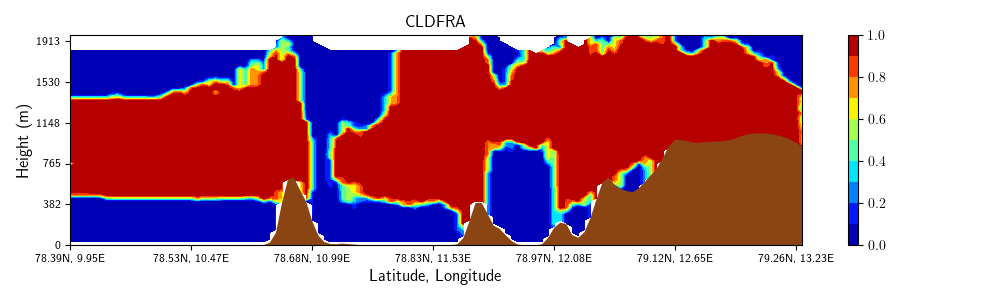

In [17]:
transect_plot(Mil3, 'CLDFRA', t=99)

In [13]:
def transect_subplots(t):#, showfig=False):
    # This function can either be used to create 3 defined subplots, or be called from animate()
    fig, (ax1, ax2, ax3) = plt.subplots(figsize=(15,6), nrows=3, sharex=True)
    
    coords = transect_plot(Mil3, 'Q_ALL_ICE', t=t, filled_contours=False, maxheight=60, pivot_coord=(78.923538, 11.909895), angle=212, axs=ax1, 
                           showfig=False, cb_levels=[0.05, 0.1, 0.2, 0.3, 0.4], cmap='Blues', time_legend=True, xlabel=False, return_coords=True)
    
    transect_plot(Mil3, 'Q_ALL_LIQUID', t=t, axs=ax1, return_coords=coords, lower_cut=0.01, pivot_coord=(78.923538, 11.909895), angle=212, 
                  maxheight=60, cmap='Blues', showfig=False, cb_levels=np.linspace(0.005, 0.45, 11), cb_extend='max', xlabel=False, title='Liquid \& Ice Mixing Ratio')
    
    
    transect_plot(Mil3, 'IWF', t=t, maxheight=60, pivot_coord=(78.923538, 11.909895), angle=212, return_coords=coords, axs=ax2, 
                  units='Fraction', showfig=False, cmap='jet', cb_levels=[0, 0.1, 0.9, 1], xlabel=False, title='Ice Water Fraction')
    
    transect_plot(Mil3, 'W', t=t, maxheight=60, units='m s$^{-1}$', pivot_coord=(78.923538, 11.909895), angle=212, axs=ax3, cmap='bwr', cb_levels=np.linspace(-4.5, 3, 50).round(1),
                  showfig=False, cb_center=0, cb_extend='both', title='Updraft')#, cb_levels=[-4.5, -3.5, -2.5, -1.5, -0.5, 0.5, 1.5, 2.5, 3.5],)
    
    #plt.subplots_adjust(hspace=0.3)
    #fig.tight_layout()
    #if showfig:
    #    plt.show()
    #else:
    #    return fig

interactive(children=(IntSlider(value=99, continuous_update=False, description='t', max=432), Output()), _dom_…

<function __main__.transect_subplots(t)>

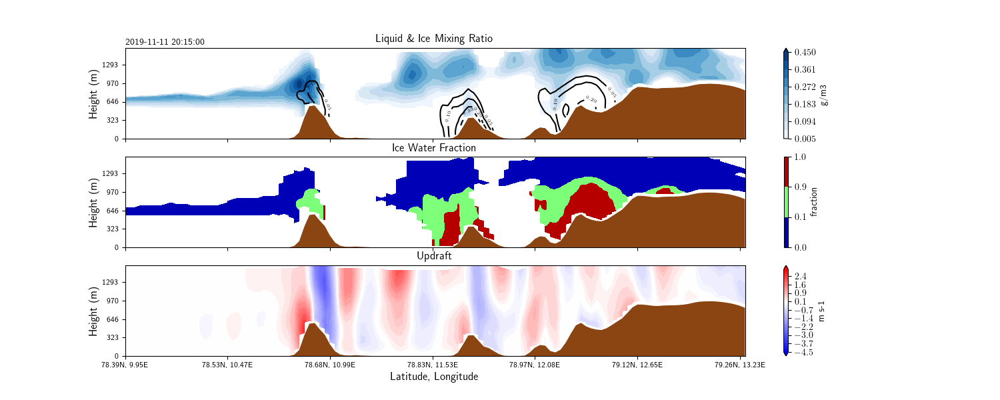

In [141]:
interact(transect_subplots, t=widgets.IntSlider(min=0, max=432, step=1, value=99, continuous_update=False))

# Animations

### New version

In [73]:
def animate(plot_func, n_timesteps=433, step_interval=1, anim_title='animation', duration=200, mp4=False, skip_spinup=0):
    '''
    Create an animation of time evolution through iterating a plotting function.
    Parameters:
    -----------
    plot_func        - (function) function for generating figure with one or more subplots
    step_interval    - (int) number of timesteps to forward each frame in animation, default is 1
    n_frames         - (int) number of frames to use in animation, default is None (full timerange is used)
    anim_title       - (string) name of the saved gif (without extension), default is 'animation'
    duration         - (int) time in seconds determining the length of the animation (determines also the speed), default is 200
    skip_spinup      - (int) number of timesteps to skip due to model spinup time, default is 0
    '''
    
    frames = []
    if n_timesteps == 'all':
        n_timesteps = len(Mil3.xrData['XTIME'][:]) - skip_spinup
    for frame in tqdm.tqdm(range(skip_spinup, skip_spinup + n_timesteps)):
        framename = f'plots/{frame}.png'
        t = frame * step_interval
        fig = plot_func(frame)
        fig.savefig(f'plots/{frame}')
        frames.append(PIL.Image.open(framename))
        plt.close()
        os.remove(framename)
    
    title = 'animations/' + anim_title + '.gif'
    frames[0].save(title, format='GIF', append_images=frames[1:], save_all=True, duration=duration, loop=1)
    if mp4:
        ffmpy.FFmpeg(inputs={title: None}, outputs={f'animations/{anim_title}.mp4': None}).run()
        os.remove(title)

In [20]:
# Example using area_plot function:
#animate(area_subplots, n_timesteps=5, H=35, anim_title='area_subplot_animation')
#animate(transect_subplots, n_timesteps='all', skip_spinup=int(6*60/5), anim_title='transect_3subplots_animation')

In [74]:
animate(area_subplots, skip_spinup=int(6*60/5), n_timesteps='all', anim_title='WP_animation')

100%|█████████████████████████████████████████████████████████████████████████████████| 361/361 [58:22<00:00,  9.70s/it]


### Converting GIF to MP4

For some reason, moviep.editor conversion no longer works (seems like a known issue with no known solution).

Instead, use ffmpeg through command line to convert into mp4 to display animation in notebook:

> cd /nird/projects/NS9600K/brittsc/WRF_output_Stian/animations

> ffmpeg -i transect_3subplots_animation.gif -movflags faststart -pix_fmt yuv420p -vf "scale=trunc(iw/2)*2:trunc(ih/2)*2" teeest.mp4


In [14]:
# This is how to convert gif to mp4 for displaying animation in nptebook NOT WORKING
# clip = mpe.VideoFileClip("animations/transect_subplots_animation.gif")
# clip.write_videofile("animations/teeest.mp4", fps=1)

### Display

In [75]:
#This displays animations with timeline bar
Video("animations/WP_animation.mp4", embed=True, width=1000, height=350)

In [8]:
Video("animations/transect_3subplots_animation.mp4", embed=True, width=1000, height=350)

In [31]:
#Old transect version (without contour artefact)
#Video("animations/transect_subplots_animation.mp4", embed=True, width=1000, height=350)

### Old version:

In [11]:
def vertical_transect_animation(data, var, directdata=None, pivot_coord=(78.923538, 11.909895), angle=0, prognostic=False, maxheight=60, 
                                step_interval=1, n_frames=None, anim_title='animation', duration=200, cb_minmax=None, cb_levels=10, 
                                cb_extend='max', units='g/m3', cutoff=-10000):
    '''
    Create an animation of time evolution of variable across the vertical transect.
    Parameters:
    -----------
    data             - (ModelOutput obj) instance of ModelOutput class with WRF model simulation data
    var              - (string) name of 3 or 4 dimensional variable to plot. If directdata is used, this will be used for creating plot title
    directdata       - (xarray object) use if the variable to plot is calculated manually and not accessed from netcdf dataset, default is None
    pivot_coord      - (list-like) coordinates of center location for transect, default is (78.923538, 11.909895) (Ny-Ålesund)
    angle            - (list-like) angle in degrees to tilt transect (positive clockwise, 0 north), defualt is 0
    prognostic       - (Boolean) if True the variable is calculated using wrf.getvar() (must be a prognostic variable available from wrf module), default is False 
    maxheight        - (int) maximum height in model levels to which the transect should be plotted (use -1 if all), default is 60
    step_interval    - (int) number of timesteps to forward each frame in animation, default is 1
    n_frames         - (int) number of frames to use in animation, default is None (full timerange is used)
    anim_title       - (string) name of the saved gif (without extension), default is 'animation'
    duration         - (int) time in seconds determining the length of the animation (determines also the speed), default is 200
    cb_minmax        - (list-like) min and max (float) of colorbar values to show, default is None
    cb_levels        - (int) number of bins (colors) to discretize contours, default is 10
    cb_extend        - (string) specify to include or exclude values outside of colorbar range specified in cb_minmax (can be 'min', 'max', 'neither' or 'both', default 'max'
    units            - (string) display name for the units of colorbar, default is 'g/m3'
    cutoff           - (float) lowest values to plot, default is -10000
    '''
    frames = []
    if n_frames is None:
        n_frames = data.Data.variables['XTIME'].shape[0]
    for frame in tqdm.tqdm(range(1, n_frames)):
        framename = f'plots/{frame}.png'
        t = frame * step_interval
        transect_plot(data, var, directdata=directdata, t=t, pivot_coord=pivot_coord, angle=angle, prognostic=prognostic, maxheight=maxheight, 
                      figname=frame, cb_minmax=cb_minmax, cb_levels=cb_levels, cb_extend=cb_extend, showfig=False, units=units, cutoff=cutoff)
        frames.append(PIL.Image.open(framename))
        plt.close()
        os.remove(framename)

    frames[0].save('animations/' + anim_title + '.gif', format='GIF', append_images=frames[1:], save_all=True, duration=duration, loop=1)

In [17]:
#vertical_transect_animation(Mil3, 'Ice Water Fraction', directdata=Mil3.IWF, angle=212, anim_title='IWF_alongwind_animation', minmaxcb=(0, 1), duration=120)

In [18]:
#plt.close('all')
#vertical_transect_animation(Mil3, 'Liquid Water Mixing Ratio', directdata=Mil3.all_liquid, angle=212, anim_title='QLIQUID_alongwind_animation', minmaxcb=(0, 0.7), duration=120)

In [38]:
#Find wind direction at given place, time and height
NYA = (78.923538, 11.909895)
wrf.ll_to_xy(Mil3.Data, *NYA)
int(wrf.getvar(Mil3.Data, 'wdir')[10, 54, 60].values)

212

# Point plots

### Code block: Averaging

In [13]:
def time_averaged_location_data(data, var, starttime, endtime, loc=(78.923538, 11.909895), latlon=True):
    '''Returns the arithmetic mean of given variable between two specified times at given location
        Parameters:
        -----------
        data             - (ModelOutput obj) instance of ModelOutput class with WRF model simulation data
        var              - (string) name of 3 or 4 dimensional variable to plot. If directdata is used, this will be used for creating plot title
        starttime        - (datetime object) datetime to start averaging from, e.g datetime.datetime(2019, 11, 12, 10)
        endtime          - (datetime object) datetime to end averaging at, e.g datetime.datetime(2019, 11, 14, 10)
        loc              - (list-like) lat, lon coordinates in decimal degrees specifying location for calculation, default is (78.923538, 11.909895) (Ny-Ålesund)
        latlon           - (boolean) if False, enter 'loc' as model indices in x and y instead, default is True
        '''
    
    if latlon:
        x, y = wrf.ll_to_xy(data.Data, *loc)
    else:
        x, y = loc
    loc_data = data.Data.variables[var][:, :, y, x]
        
    if type(starttime) != int: #Assume user entered datetime object instead of model time indices
        starttime, endtime = timeidx_from_datetime(data, starttime), timeidx_from_datetime(data, endtime)
    time_data = loc_data[starttime:endtime]
    mean_data = np.mean(time_data, axis=0)
    return mean_data

### Code block: Plotting

In [22]:
def altitude_point_plot(data, var, starttime, endtime, loc=(78.923538, 11.909895), latlon='True', figure=None, ax=None, color=None, 
                        xlabel=None, label=None, maxheight=-1, showfig=False):
    ''' Create a point plot of time-averaged location data with altitude along y-axis and variable along x-axis. 
        Returns the plt.axes object (either new or existing if one is passed) if showfig is not set to True.
        Parameters:
        -----------
        data          - (ModelOutput obj) instance of ModelOutput class with WRF model simulation data
        var           - (string) name of 3 or 4 dimensional variable to plot. If directdata is used, this will be used for creating plot title
        starttime     - (datetime object) datetime to start averaging from, e.g datetime.datetime(2019, 11, 12, 10)
        endtime       - (datetime object) datetime to end averaging at, e.g datetime.datetime(2019, 11, 14, 10)
        loc           - (list-like) lat, lon coordinates in decimal degrees specifying location for calculation, default is (78.923538, 11.909895) (Ny-Ålesund)
        latlon        - (boolean) if False, enter 'loc' as model indices in x and y instead, default is True
        figure        - (list-like) specify plt.figure instance for creating several subplots. Must be list-like with first entry fig instance, second of form 321. Default is None
        ax            - (plt.axes object) specify axes to plot several data in the same plot, default is None
        color         - (string) name of color for for graph (must be supported by plt.plot, eg. 'b'), default is None
        xlabel        - (string) name of label for x-axis, default is None
        label         - (string) name of graph to be included in legend, default is None
        maxheight     - (int) maximum height in model levels to which the transect should be plotted (use -1 if all), default is 60 
        showfig       - (boolean) if True, call plt.show() to display the plot, default is False
        '''

    data_to_plot = time_averaged_location_data(data, var, starttime, endtime, loc=loc, latlon=latlon)

    if latlon:
        x, y = wrf.ll_to_xy(data.Data, *loc)
    else:
        x, y = loc
        
    H = wrf.getvar(data.Data, 'z')[:, y, x]
    
    mHidx = len(H[H <= maxheight]) #Finds level index from height in meters
    
    if figure is None:
        fig = plt.figure(figsize=(8, 4))
        ax = fig.add_subplot()
    elif ax is None:
        ax = figure[0].add_subplot(figure[1])
    ax.plot(data_to_plot[:mHidx] * 1000, H[:mHidx], color=color, label=label)
    ax.set_xscale('log')
    ax.set_xlabel(xlabel)
    ax.set_ylabel('Altitude [m]')
    ax.legend(loc='upper right')
    if showfig:
        plt.show()
    else:
        return ax
    

### Example usage

In [23]:
def compare_schemes(scheme):
    #Flight 1 from overview paper
    fig = plt.figure(figsize=(10, 4))
    ax1 = altitude_point_plot(scheme, 'QNCLOUD', figure=(fig, 141), color='y', xlabel='LDNC [#/kg]', label='flight 1', starttime=datetime.datetime(2019, 11, 12, 10), endtime=datetime.datetime(2019, 11, 12, 11), maxheight=2000)
    ax2 = altitude_point_plot(scheme, 'QCLOUD', figure=(fig, 142), color='y', xlabel='LWC [g/kg]', label='flight 1', starttime=datetime.datetime(2019, 11, 12, 10), endtime=datetime.datetime(2019, 11, 12, 11), maxheight=2000)
    ax3 = altitude_point_plot(scheme, 'QNICE', figure=(fig, 143), color='y', xlabel='ICNC [#/kg]', label='flight 1', starttime=datetime.datetime(2019, 11, 12, 10), endtime=datetime.datetime(2019, 11, 12, 11), maxheight=2000)
    ax4 = altitude_point_plot(scheme, 'QICE', figure=(fig, 144), color='y', xlabel='IWC [g/kg]', label='flight 1', starttime=datetime.datetime(2019, 11, 12, 10), endtime=datetime.datetime(2019, 11, 12, 11), maxheight=2000)

    #Flight 2 from overview paper
    altitude_point_plot(scheme, 'QNCLOUD', figure=(fig, 141), ax=ax1, color='g', xlabel='LDNC [#/kg]', label='flight 2', starttime=datetime.datetime(2019, 11, 12, 12, 15), endtime=datetime.datetime(2019, 11, 12, 14), maxheight=2000)
    altitude_point_plot(scheme, 'QCLOUD', figure=(fig, 142), ax=ax2, color='g', xlabel='LWC [g/kg]', label='flight 2', starttime=datetime.datetime(2019, 11, 12, 12, 15), endtime=datetime.datetime(2019, 11, 12, 14), maxheight=2000)
    altitude_point_plot(scheme, 'QNICE', figure=(fig, 143), ax=ax3, color='g', xlabel='ICNC [#/kg]', label='flight 2', starttime=datetime.datetime(2019, 11, 12, 12, 15), endtime=datetime.datetime(2019, 11, 12, 14), maxheight=2000)
    altitude_point_plot(scheme, 'QICE', figure=(fig, 144), ax=ax4, color='g', xlabel='IWC [g/kg]', label='flight 2', starttime=datetime.datetime(2019, 11, 12, 12, 15), endtime=datetime.datetime(2019, 11, 12, 14), maxheight=2000)

    #Flight 3 from overview paper
    altitude_point_plot(scheme, 'QNCLOUD', figure=(fig, 141), ax=ax1, color='b', xlabel='LDNC [#/kg]', label='flight 3', starttime=datetime.datetime(2019, 11, 12, 15, 45), endtime=datetime.datetime(2019, 11, 12, 17), maxheight=2000)
    altitude_point_plot(scheme, 'QCLOUD', figure=(fig, 142), ax=ax2, color='b', xlabel='LWC [g/kg]', label='flight 3', starttime=datetime.datetime(2019, 11, 12, 15, 45), endtime=datetime.datetime(2019, 11, 12, 17), maxheight=2000)
    altitude_point_plot(scheme, 'QNICE', figure=(fig, 143), ax=ax3, color='b', xlabel='ICNC [#/kg]', label='flight 3', starttime=datetime.datetime(2019, 11, 12, 15, 45), endtime=datetime.datetime(2019, 11, 12, 17), maxheight=2000)
    altitude_point_plot(scheme, 'QICE', figure=(fig, 144), ax=ax4, color='b', xlabel='IWC [g/kg]', label='flight 3', showfig=True, starttime=datetime.datetime(2019, 11, 12, 15, 45), endtime=datetime.datetime(2019, 11, 12, 17), maxheight=2000)
    fig.tight_layout()

#### Milbrandt

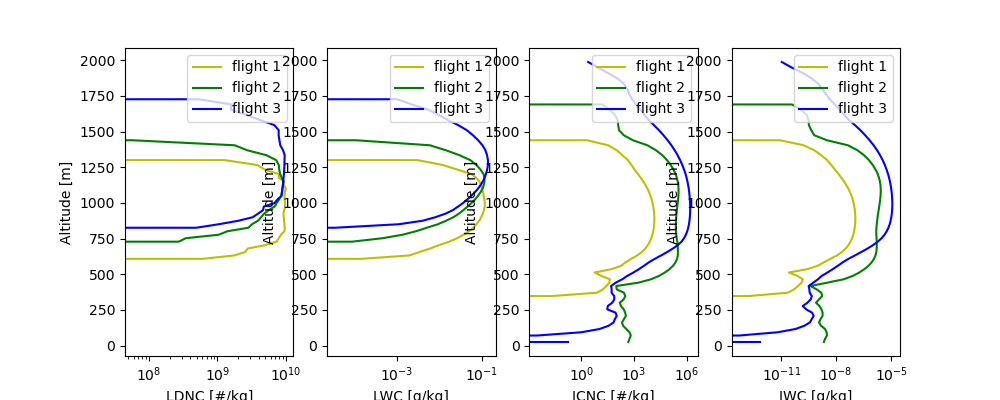

In [24]:
compare_schemes(Mil3)

#### Morrison

In [ ]:
#compare_schemes(Mor3)

# Time-height crossplot

### Code block

In [18]:
def time_cross(data, var, directdata=None, loc=(78.923538, 11.909895), cutoff=0.001, maxheight=1000, figure=None, ax=None, 
               alpha=1, xlabel=None, showfig=False, units='g m$^{-3}$', filled_contours=True, cmap='jet', cb_levels=11, 
               cb_extend='neither', cb_orientation='vertical', cb_location='right', cb_pad=0.01, cb_center=None, plot_pblh=False, 
               skip_spinup=0, title=None):
    '''
    Create an animation of time evolution of variable across the vertical transect.
    Parameters:
    -----------
    data             - (ModelOutput obj) instance of ModelOutput class with WRF model simulation data
    var              - (string) name of 3 or 4 dimensional variable to plot. If directdata is used, this will be used for creating plot title
    directdata       - (xarray object) use if the variable to plot is calculated manually and not accessed from netcdf dataset, 
                                       default is None
    loc              - (list-like) lat, lon coordinates in decimal degrees specifying location for plot, 
                                   default is (78.923538, 11.909895) (Ny-Ålesund)
    cutoff           - (float) lowest values to plot, default is 0.001
    maxheight        - (int) maximum height in meters to which the transect should be plotted, default is 1000
    figure           - (plt.figure obj) figure to generate plots for, default is None
    ax               - (plt.axes obj) axes to generate plots on. Must be specified if figure is not None, default is None
    alpha            - (float) specify opacity of contours. 0 is fully transparent, 1 is fully opaque, default is 1
    xlabel           - (string) name of label for x-axis, default is None
    showfig          - (boolean) if True, call plt.show() to display the plot, default is False
    units            - (string) display name for the units of colorbar, default is 'g/m3'
    filled_contours  - (boolean) use either filled (True) or not filled (False) contour lines, default is True
    cmap             - (string) name of plt.cmap colormap, default is 'jet'
    cb_levels        - (list-like) intervals for contour color bins, default is 11
    cb_extend        - (string) specify to include or exclude values outside of colorbar range specified in cb_minmax 
                                (can be 'min', 'max', 'neither' or 'both', default 'max'
    cb_orientation   - (string) specify orientation of colorbar, either 'vertical' or 'horizontal', default is 'vertical'
    cb_location      - (string) specify placement of colorbar, either 'bottom', 'top', 'right', or 'left', default is 'right'
    cb_pad           - (float) specify padding space between plot and colorbar in fraction of total plot width/height, default is 0.01
    cb_center        - (float) set the value to use as the center of the colormap, default is None
    plot_pblh        - (boolean) plot the planetary boundary layer height along with the other variable, default is False
    skip_spinup      - (int) number of timesteps to skip due to model spinup, default is 0
    '''
    x, y = wrf.ll_to_xy(data.Data, *loc)
    H = wrf.getvar(data.Data, 'z')[:, y, x]
    mHidx = len(H[H <= maxheight])
    
    if directdata is not None:
        to_plot = wrf.to_np(directdata[skip_spinup:, :, x, y])
        to_plot[to_plot <= cutoff] = np.nan
    else:
        to_plot = data.xrData[var].isel(Time=slice(skip_spinup, None), west_east=x, south_north=y)
        
        #to_plot = to_plot.where(to_plot <= cutoff, to_plot, np.nan)
        
    TIME, HEIGHT = np.meshgrid(data.xrData['XTIME'][skip_spinup:], H[:mHidx])
    
    if figure is None:
        fig, ax = plt.subplots(figsize=(10,2))
    else:
        fig = figure
    
    if filled_contours:
        if cb_center is not None:
            norm = matplotlib.colors.TwoSlopeNorm(vcenter=cb_center)
            plot = ax.contourf(TIME.T, HEIGHT.T, to_plot[:, :mHidx], cmap=plt.get_cmap(cmap), levels=cb_levels, extend=cb_extend, alpha=alpha, norm=norm)
        else:
            plot = ax.contourf(TIME.T, HEIGHT.T, to_plot[:, :mHidx], cmap=plt.get_cmap(cmap), levels=cb_levels, extend=cb_extend, alpha=alpha)
    else:
        plot = ax.contour(TIME.T, HEIGHT.T, to_plot[:, :mHidx], levels=cb_levels, colors='k', extend=cb_extend, alpha=alpha, linewidths=0.5)
        ax.clabel(plot, plot.levels, inline=True, fontsize=7)
    
    if plot_pblh:
        ax.plot(data.xrData['XTIME'][skip_spinup:], data.xrData['PBLH'][skip_spinup:, x, y], 'brown', linestyle='--', linewidth=1)
        
#     x_ticks = (np.arange(to_plot.shape[0]) + skip_spinup) * 5 # Convert timestep number to minutes
#     x_labels = [(Mil3.date + datetime.timedelta(minutes=int(t))).strftime('%H:%M') for t in Mil3.xrData['XTIME'][skip_spinup:]]
#     ax.set_xticks(x_ticks[::24])
#     ax.set_xticklabels(x_labels[::24], rotation=25, fontsize=8)
    
    ax.set_ylabel('Altitude [m]')
    #ax.set_xlabel('')
        
    fig.tight_layout()
    if title is None:
        ax.set_title(var)
    else:
        ax.set_title(title)
    if directdata is not None:
        if filled_contours:
            cbar = plt.colorbar(plot, orientation=cb_orientation, label=units, ax=ax, location=cb_location, pad=cb_pad)
    else:
        if units is None:
            units = data.xrData[var].units
        if filled_contours:
            cbar = plt.colorbar(plot, orientation=cb_orientation, label=units, ax=ax, location=cb_location, pad=cb_pad)
            
    if showfig:
        plt.show()

### Example usage

In [123]:
# plt.close('all')
# fig = plt.figure(figsize=(14,3))
# ax1 = fig.add_subplot(111)
# time_cross(Mil3, 'Liquid Water Content', directdata=Mil3.all_liquid, cmap='Blues', figure=fig, ax=ax1, cb_levels=np.linspace(0, 0.25, 11), 
#            cb_extend='max', alpha=0.9, cb_location='right', skip_spinup=int(6*60/5))
# time_cross(Mil3, 'Ice \& Liquid Water Content', directdata=Mil3.all_ice, figure=fig, ax=ax1, filled_contours=False, cb_levels=np.linspace(0, 0.05, 6), 
#            showfig=True, cutoff=0.0001, plot_pblh=True, skip_spinup=int(6*60/5))

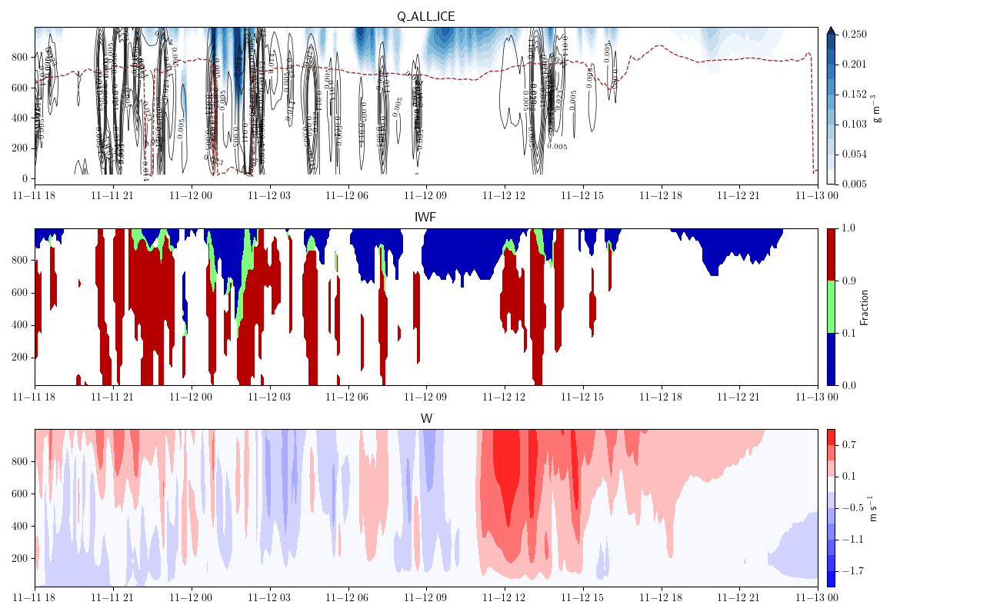

In [135]:
fig = plt.figure(figsize=(13,8))
ax3 = fig.add_subplot(313)
ax2 = fig.add_subplot(312, sharex=ax3)
ax1 = fig.add_subplot(311, sharex=ax3)


# time_cross(Mil3, 'W', cutoff=-1000, figure=fig, ax=ax1, units='m s$^{-1}$', cmap='bwr', cb_center=0, cb_levels=np.linspace(-2, 1, 11))
# time_cross(Mil3, 'Liquid Water Content', directdata=Mil3.all_liquid, figure=fig, ax=ax1, cb_levels=np.linspace(0, 0.3, 11), cb_extend='max', cmap='Blues')

time_cross(Mil3, 'Q_ALL_LIQUID', cmap='Blues', figure=fig, ax=ax1, cb_levels=np.linspace(0.005, 0.25, 11), cb_extend='max', alpha=0.9, 
           cb_location='right', skip_spinup=int(6*60/5))
time_cross(Mil3, 'Q_ALL_ICE', figure=fig, ax=ax1, filled_contours=False, cb_levels=np.linspace(0.005, 0.05, 6), 
           cutoff=0.0001, plot_pblh=True, skip_spinup=int(6*60/5))

time_cross(Mil3, 'IWF', figure=fig, ax=ax2, cutoff=-1, cb_levels=[0, 0.1, 0.9, 1], units='Fraction', skip_spinup=int(6*60/5))
time_cross(Mil3, 'W', cutoff=-1000, figure=fig, ax=ax3, units='m s$^{-1}$', cmap='bwr', cb_center=0, cb_levels=np.linspace(-2, 1, 11), showfig=True, skip_spinup=int(6*60/5))

In [45]:
#QVAPOR = Mil3.convert_to_gm3(Mil3.xrData['QVAPOR'][:, :Mil3.up_to_level, :, :])
RH = wrf.rh(Mil3.xrData['QVAPOR'][:, :Mil3.up_to_level, :, :], Mil3.P, Mil3.T)

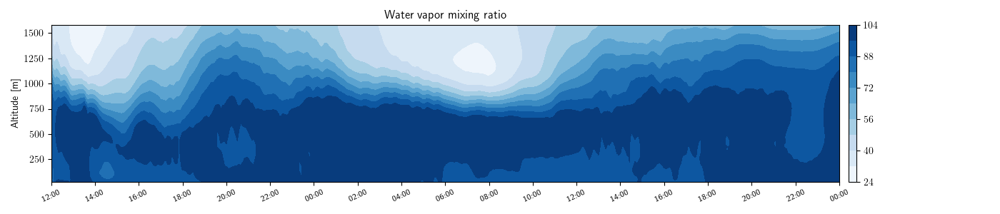

In [46]:
plt.close('all')
fig = plt.figure(figsize=(14, 3))
ax = fig.add_subplot()
time_cross(Mil3, 'Water vapor mixing ratio', directdata=RH, maxheight=1600, cutoff=-400, figure=fig, ax=ax,cmap='Blues', units='%')
fig.tight_layout()
plt.show()

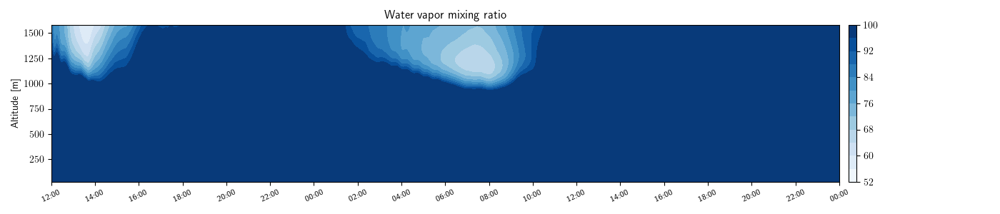

In [43]:
plt.close('all')
fig = plt.figure(figsize=(14, 3))
ax = fig.add_subplot()
time_cross(Mil3, 'Water vapor mixing ratio', directdata=RH, maxheight=1600, cutoff=-400, figure=fig, ax=ax,cmap='Blues', units='%')
fig.tight_layout()
plt.show()

## Model level with altitude

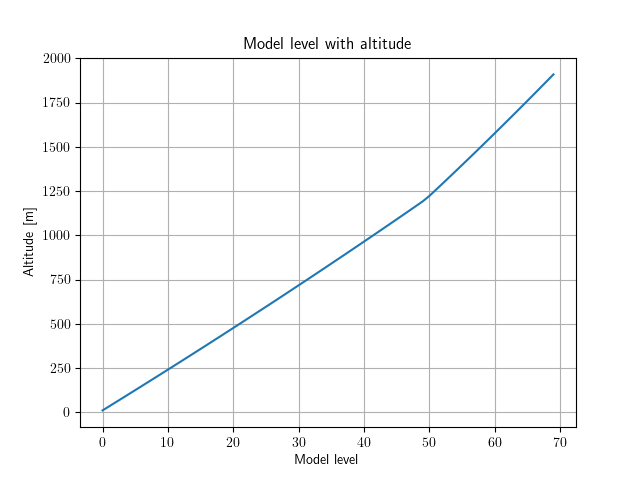

In [138]:
plt.close('all')
upto = len(Mil3.xrData['ZNU'][1, :])
plt.plot(range(upto), wrf.getvar(Mil3.Data, 'z')[:upto, 10,10])
plt.grid()
plt.title('Model level with altitude')
plt.xlabel('Model level')
plt.ylabel('Altitude [m]')
plt.show()

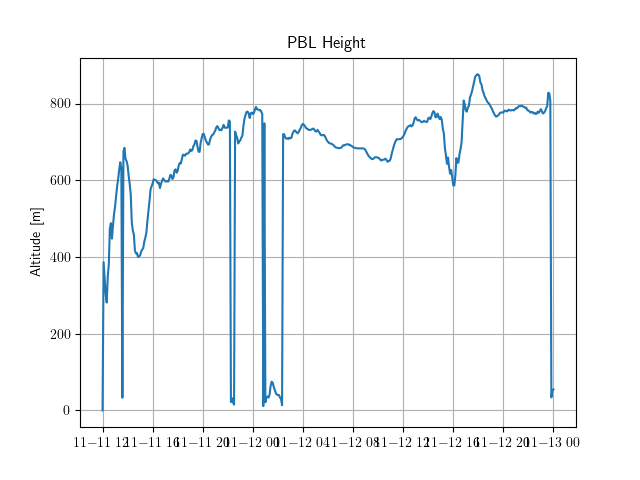

In [139]:
loc = (78.923538, 11.909895)
x, y = wrf.ll_to_xy(Mil3.Data, *loc)
plt.close('all')
plt.plot(Mil3.xrData['XTIME'][:], Mil3.xrData['PBLH'][:, x, y])
plt.grid()
plt.title('PBL Height')
plt.ylabel('Altitude [m]')
plt.show()

### IWC and LWC vs Updrafts

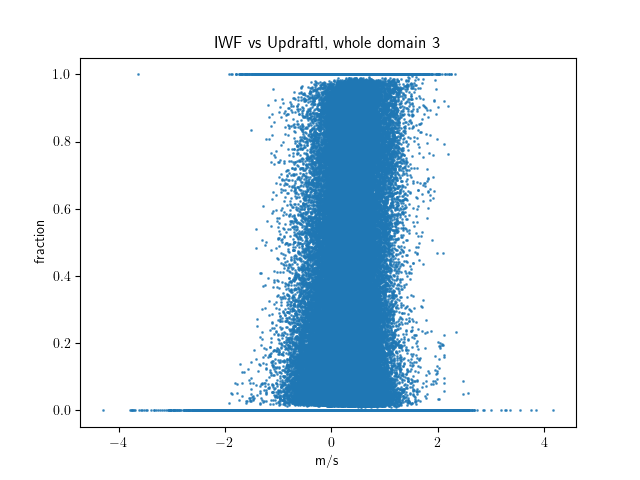

In [162]:
plt.close('all')
loc = (78.923538, 11.909895)
x, y = wrf.ll_to_xy(Mil3.Data, *loc)
w = Mil3.xrData.W.isel(Time=slice(6*15, None), bottom_top_stag=35)#, west_east=x, south_north=y)
var = Mil3.xrData.IWF.isel(Time=slice(6*15, None), bottom_top=35)#, west_east=x, south_north=y)
plt.scatter(w, var, s=1, alpha=0.7)
plt.xlabel('m/s')
plt.ylabel('fraction')
plt.title('IWF vs Updraft, whole domain 3')
plt.show()

# Up next


Clean up notebook and add markdowns

Vertical cross with time (add units and lables)

Wind velocity alongwind transect

Convert units of mixing ratio from kg/kg to g/m3 (v)

Set threshold for ice mixing ratio to avoid weird IWF plots (v)

Plot ice contours on top of liquid filled contours in the same plot. (v)

Use same colorbar scale for ice and water contents (v)

Change x axis ticks from minutes from start to datetime (v)

-Do some stuff with wind velocities

- Add to the time-cross plot: windbarbs, temperature contours. Change from colored contours to black contours with numbers

- Find method to locate boundary layer height and plot cloud variables in and just below it (maybe use potential temperature - it should be constant below and increase above and within)
 --- This variable is already in WRF output

- Make pdf of mixed-phase regions in the whole domain, similar to Korolev in https://agupubs.onlinelibrary.wiley.com/doi/10.1029/2021JD034832

- Talk to Trude about meeting and discuss whether it makes sense to look for pockets in this domain or if the clouds are too much influenced by dynamics (topography)

- Maybe repeat something similar to 'WBF' regime and 'Both-grow' regime plot from https://agupubs.onlinelibrary.wiley.com/doi/full/10.1029/2010JD015375

- Prepare 'presentation' for next meeting with supervisors to make it easier to show plots and compare schemes?

- Liquid and Ice Water Paths (v)

- Outgoing longwave radiation

- Make transect plot with ice and liquid in the same figure (v)

- Show boundary layer in plots (v)

- Re-do animations (maybe do IWP area plot animation to see if ice is produced without topographic influence?) (v)

- Maybe calculate IWF based on IWP and LWP?

MEETING 27/10
- Vertical velocity and connection to ice pocket formation - is it correlated?

- Make spaghetti plots of model data over Ny-Ålesund: plot LWC & IWC vs time for different (in-cloud) vertical levels and adjacent grid cells close to the HoloBalloon

- Make scatter plot of LWC & IWC vs vertical velocity (and other thermodynamic parameters such as temperature, cloud top temperature) and look for trends

- Repeat animations and do comparisons between Milbrandt and Morrison runs (export everything to a new document to make it all more systematic)

MEETING 15/12
- Color code scatter plot according to temperature

- Drop thresholds for calculating IWF and apply cloud fraction mask instead.

- Maybe not include snow, graupel, rain and keep only hydrometeors that stay in-cloud.

- Find method to area plot for given theta plane, or to extract cloud values at cloud top altitude etc.

- Create a clear analysis procedure that can be applied to several model runs, to quantify cloud pocket occurrence and relate it to TD parameters.

- Ideas:
    - Find a way to extract cloud pockets for a given level (or for given isothermal or such) and correlate with updraft, temp, CTT etc.

- HOLODATA - look into this and check that we have it.